<a href="https://colab.research.google.com/github/jeffblackadar/image_work/blob/master/coin_photo_processor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Coin photo processing.
This program opens a raw image of a coin, removes the background, crops it and then crops it again to get just to portrait.

## First mount the Google drive:

In [0]:
# Mount the drive first.
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


<class 'numpy.ndarray'>


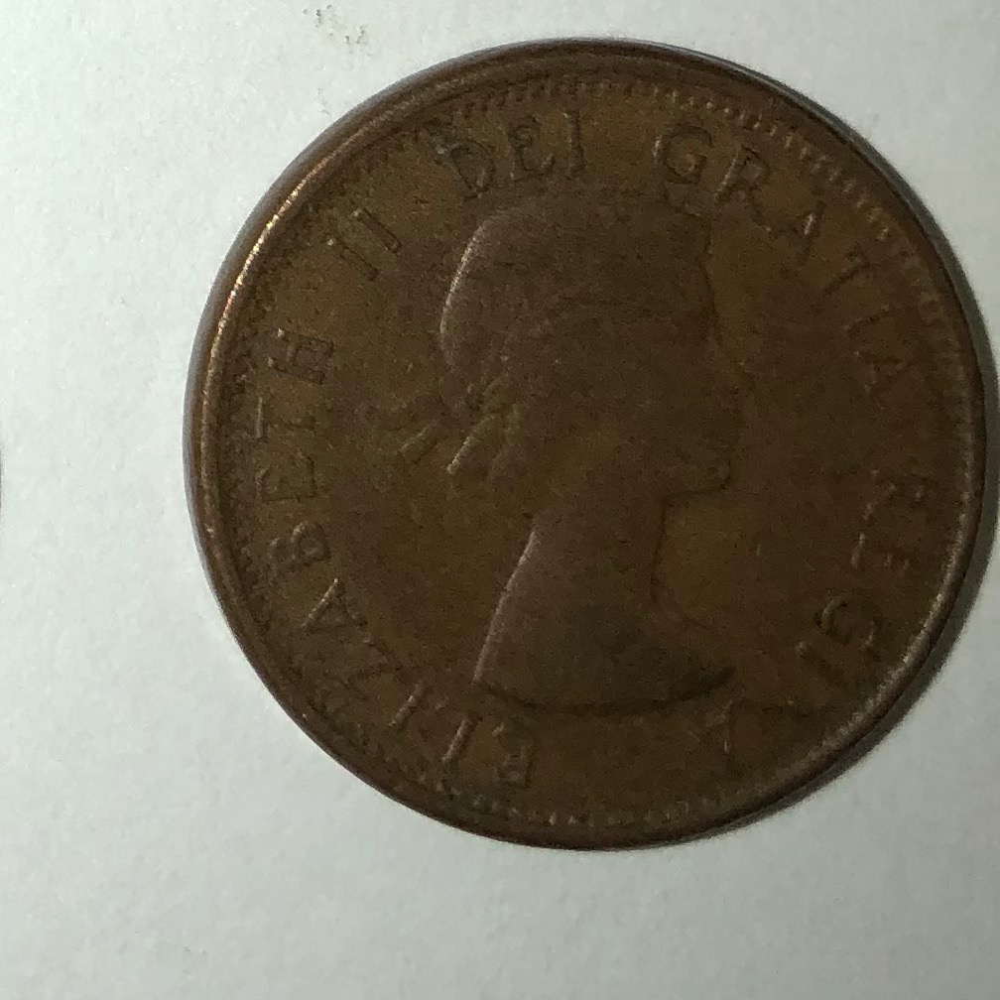

<class 'numpy.ndarray'>


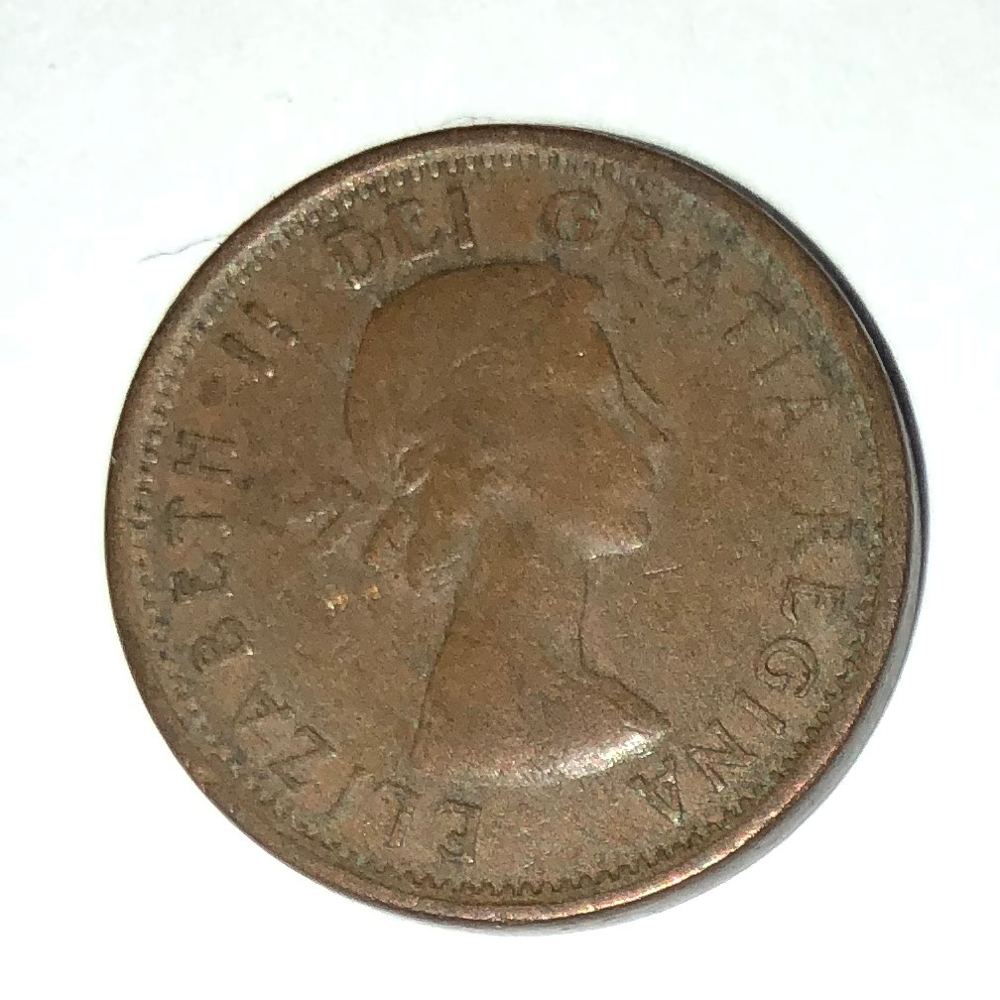

(1008, 1008)
Whitespace removal
(811, 829, 3)
(811, 829)
Whitespace removal
(556, 556, 3)


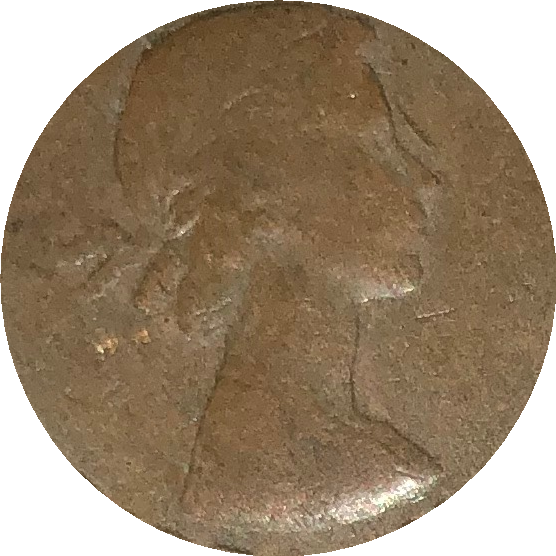

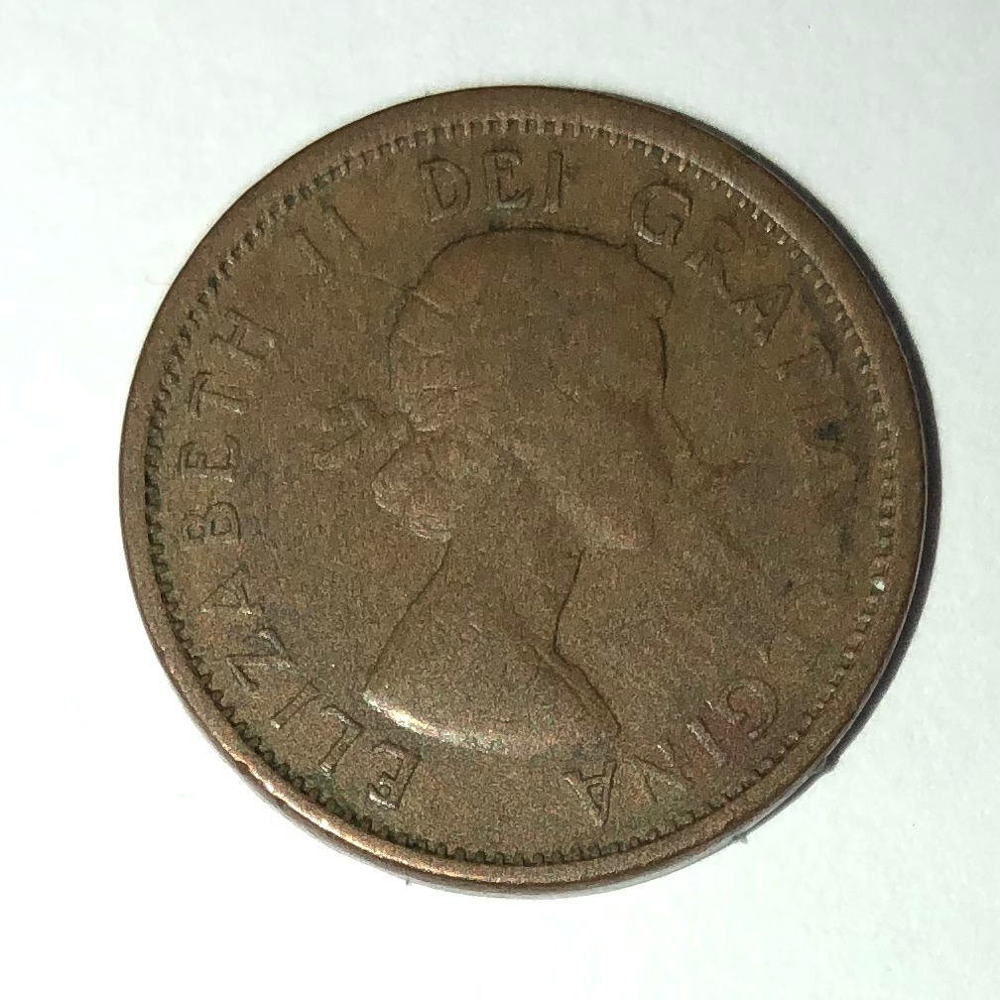

(1008, 1008)
Whitespace removal
(815, 828, 3)
(815, 828)
Whitespace removal
(560, 560, 3)


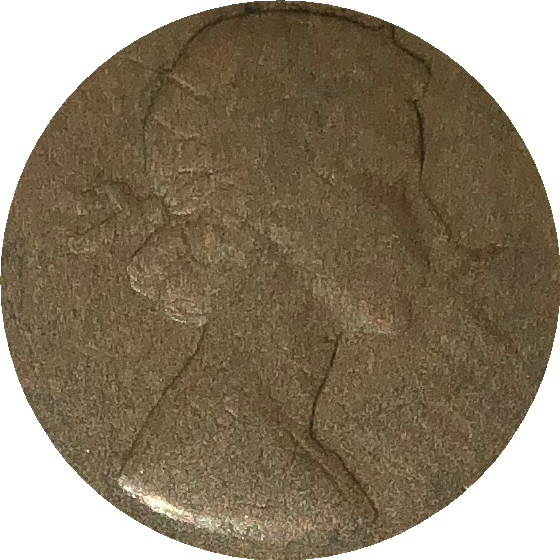

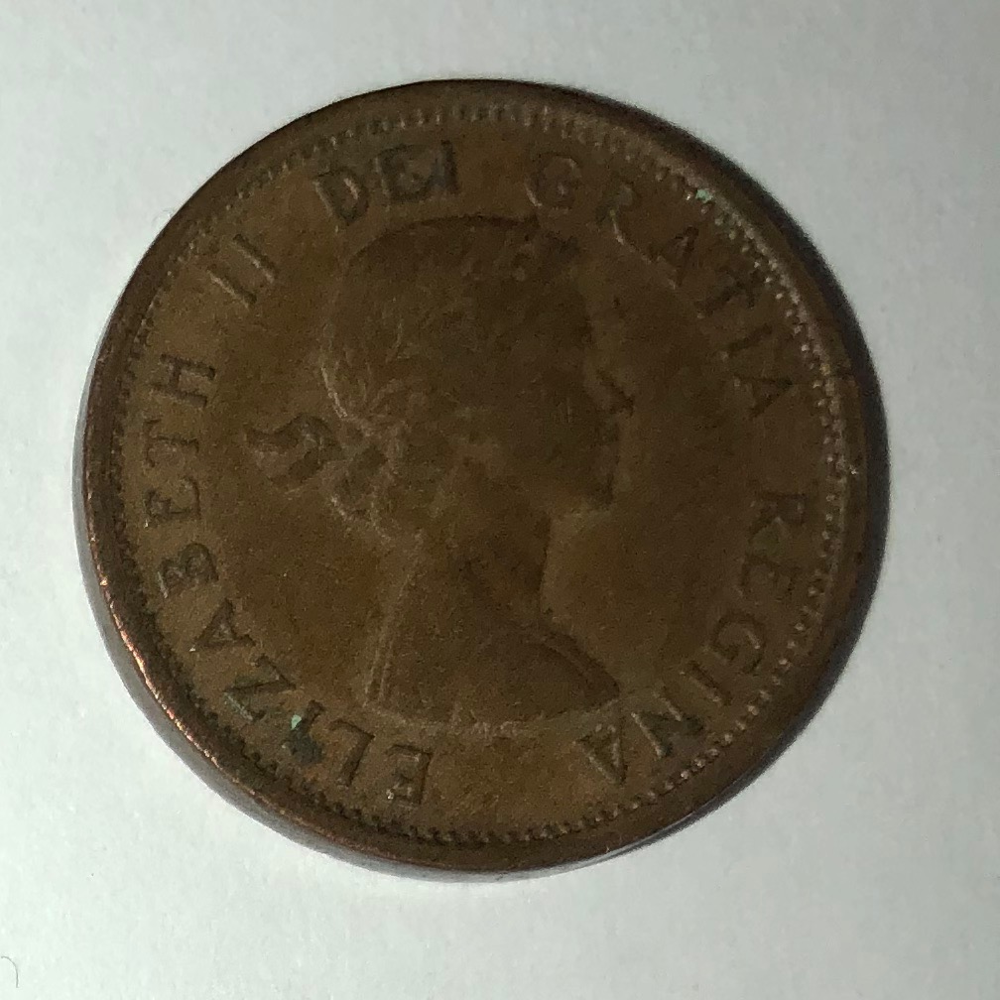

(1008, 1008)
Whitespace removal
(807, 822, 3)
(807, 822)
Whitespace removal
(554, 554, 3)


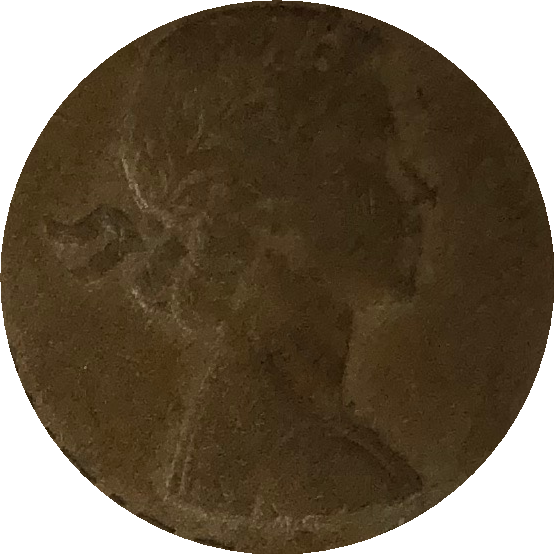

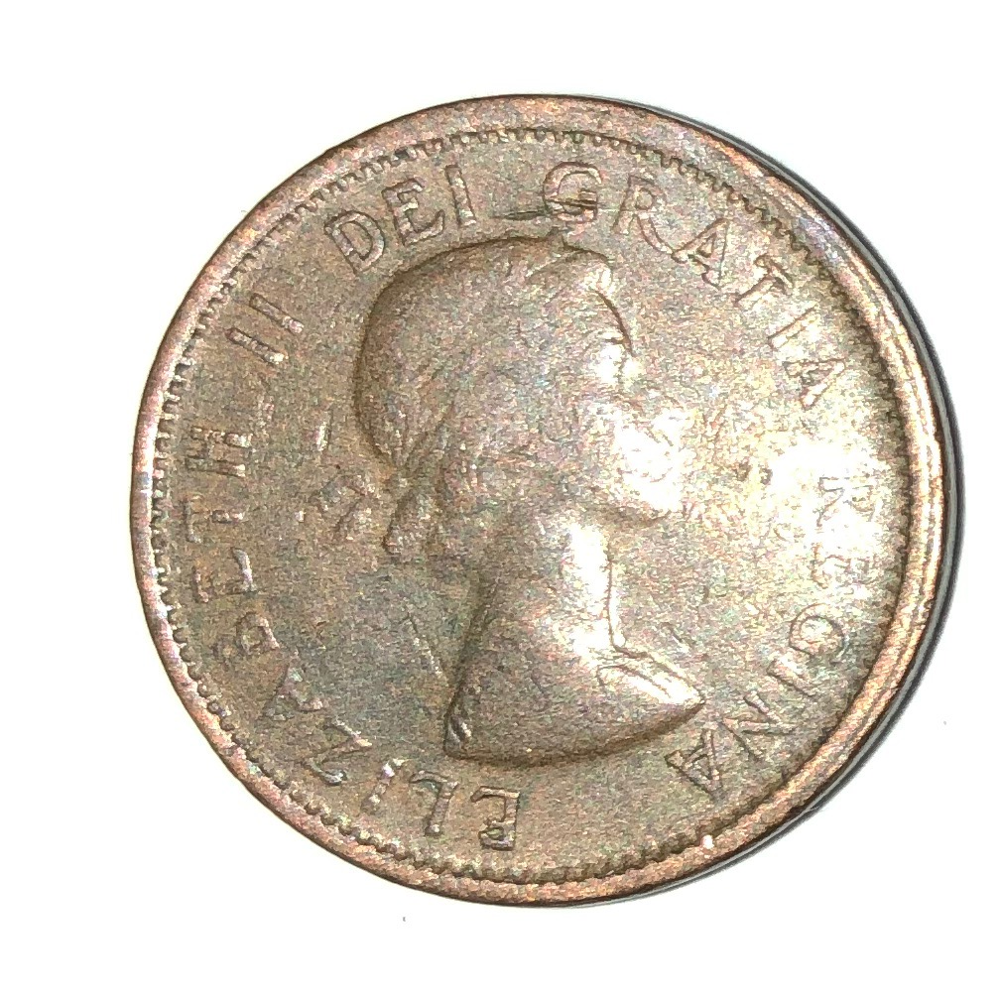

(1008, 1008)
Whitespace removal
(819, 839, 3)
(819, 839)
Whitespace removal
(562, 539, 3)


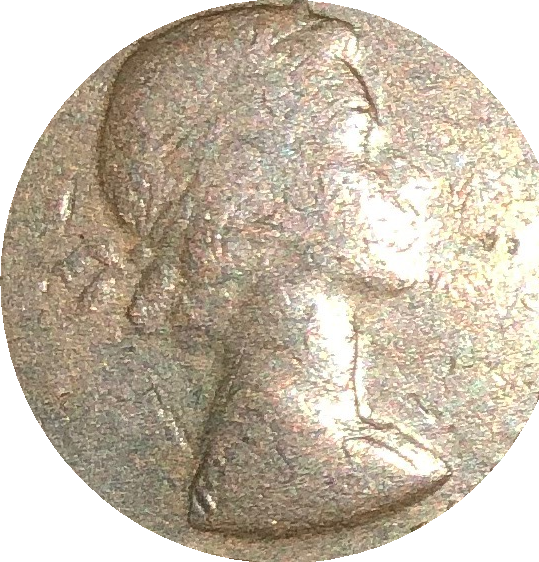

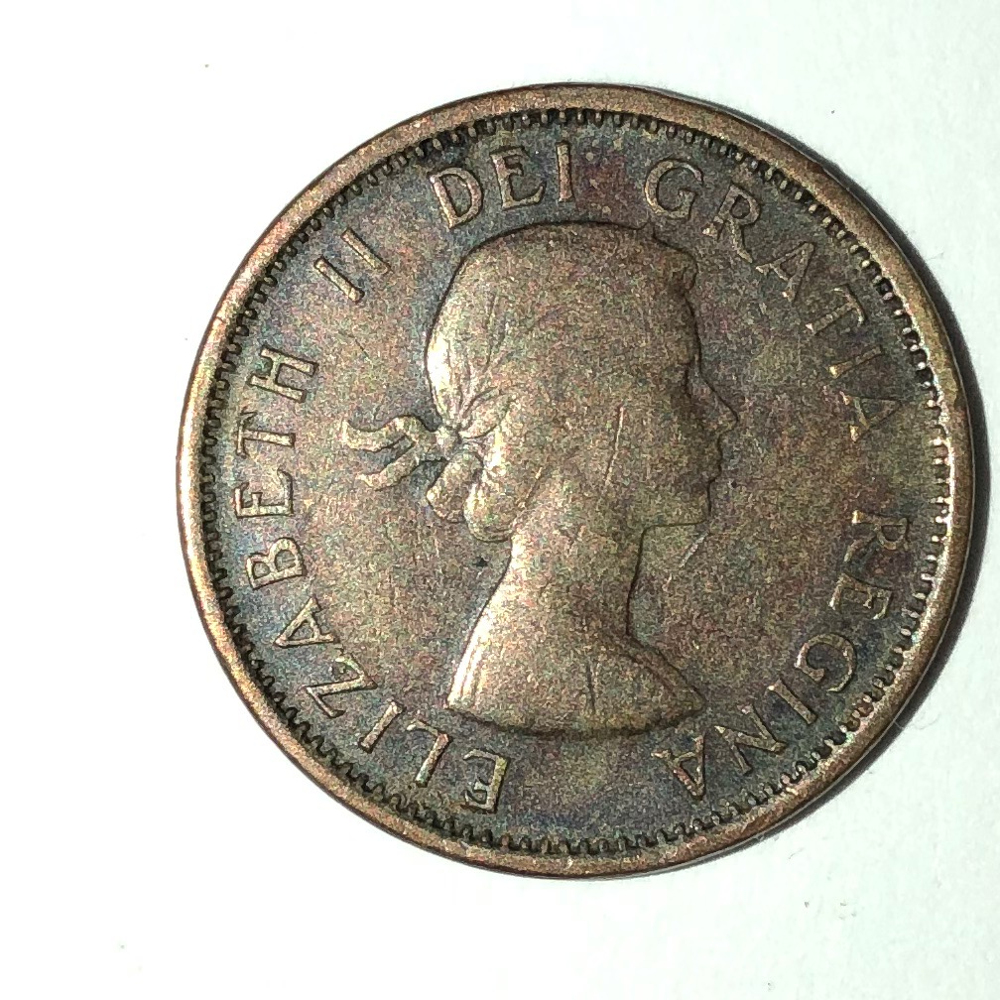

(1008, 1008)
Whitespace removal
(803, 819, 3)
(803, 819)
Whitespace removal
(550, 549, 3)


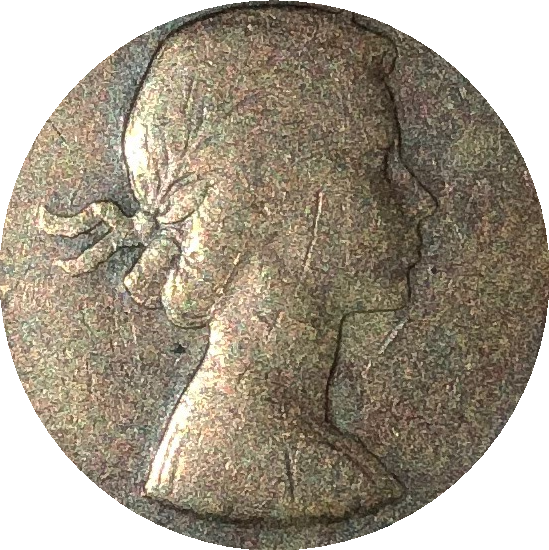

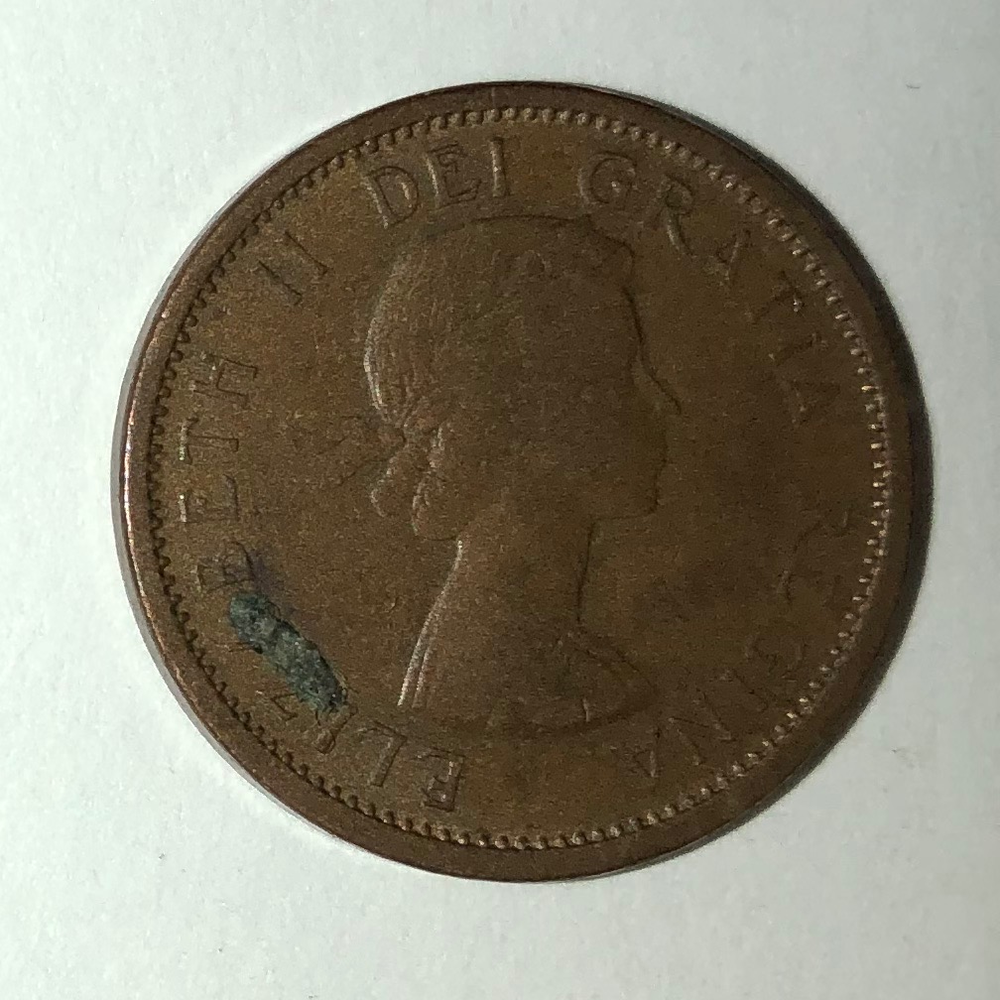

(1008, 1008)
Whitespace removal
(808, 822, 3)
(808, 822)
Whitespace removal
(554, 554, 3)


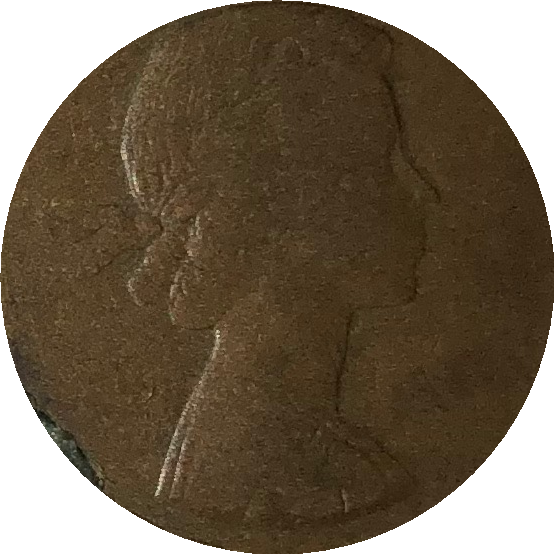

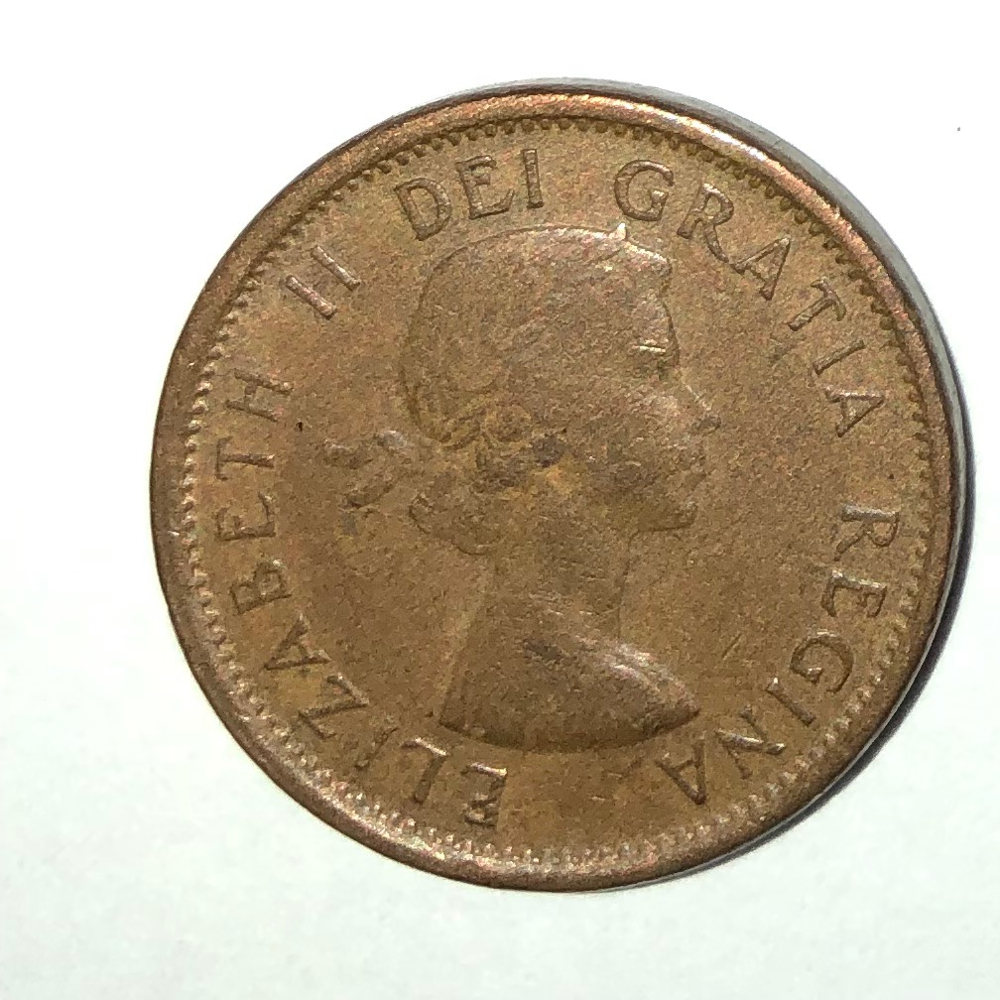

(1008, 1008)
Whitespace removal
(814, 830, 3)
(814, 830)
Whitespace removal
(557, 558, 3)


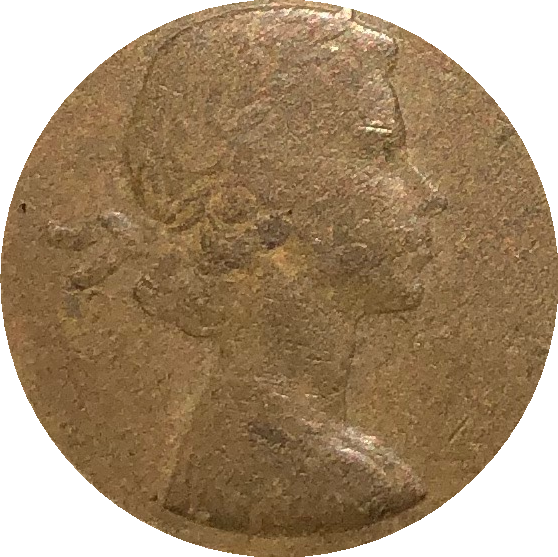

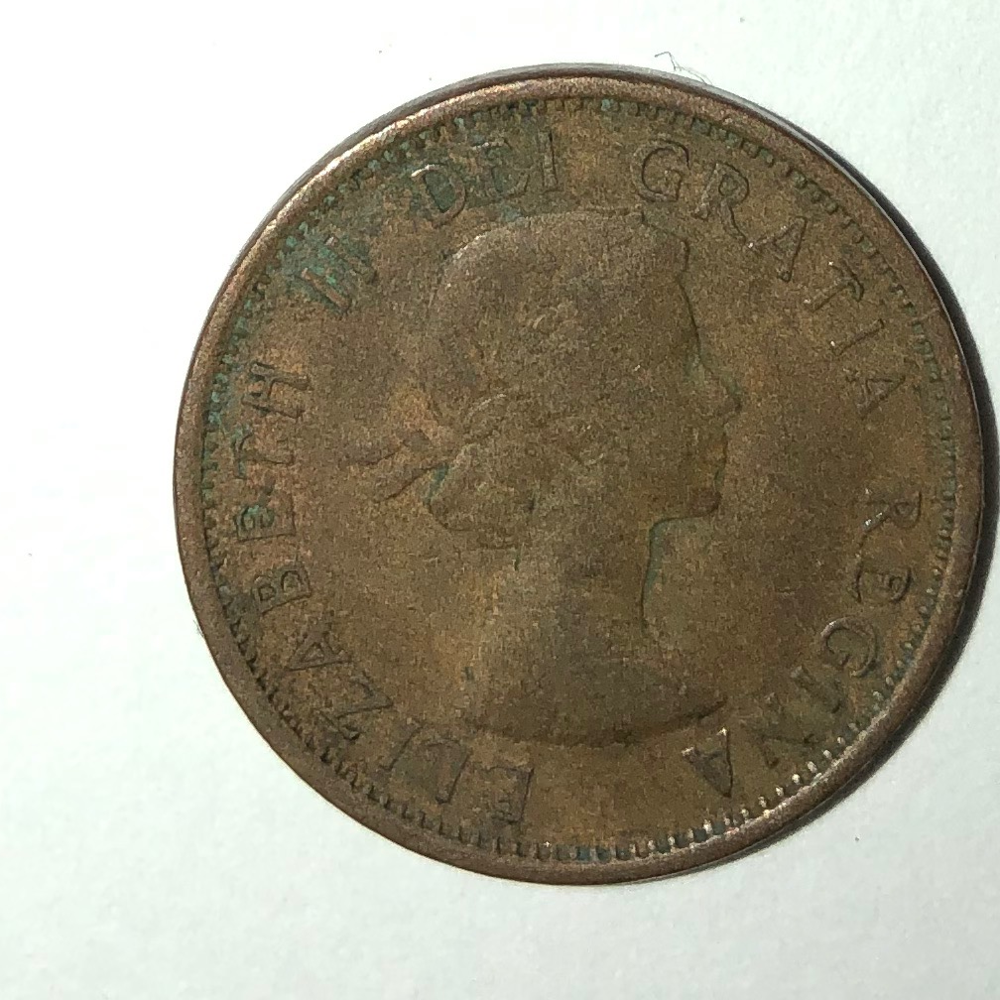

(1008, 1008)
Whitespace removal
(824, 833, 3)
(824, 833)
Whitespace removal
(566, 566, 3)


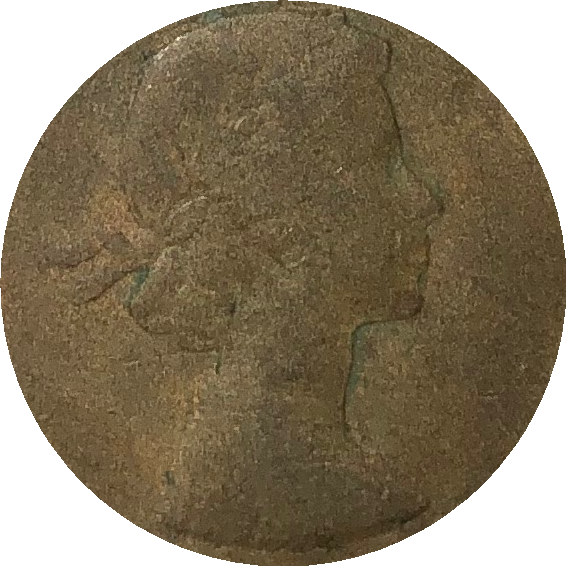

In [20]:
import numpy
import cv2
from google.colab.patches import cv2_imshow

def img_remove_background(imgo):
    imgo = coin1img
    height, width = imgo.shape[:2]

    #Create a mask holder
    mask = numpy.zeros(imgo.shape[:2],numpy.uint8)

    #Grab Cut the object
    bgdModel = numpy.zeros((1,65),numpy.float64)
    fgdModel = numpy.zeros((1,65),numpy.float64)

    #Hard Coding the Rect… The object must lie within this rect.
    rect = (1,1,width-5,height-5)
    cv2.grabCut(imgo,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)
    mask = numpy.where((mask==2)|(mask==0),0,1).astype(numpy.uint8)
    imgp = imgo*mask[:,:,numpy.newaxis]
    
    #Get the background
    background=imgo-imgp

    #Change all pixels in the background that are not black to white
    background[numpy.where((background > [0,0,0]).all(axis = 2))] = [255,255,255]

    #Add the background and the image
    final=background+imgp
    #To be done – Smoothening the edges….

    return(final)

def img_remove_whitespace(imgo):
    
    #convert to black and white - make it simpler?
    # define a threshold, 128 is the middle of black and white in grey scale
    thresh = 128

    # assign blue channel to zeros
    img_binary = cv2.threshold(imgo, thresh, 255, cv2.THRESH_BINARY)[1]
    
    gray_img = cv2.cvtColor(img_binary, cv2.COLOR_BGR2GRAY)
    print(gray_img.shape)

    # allow for 254 (slightly less than every pixel totally white to allow some specks)
    #count in from the right edge until the mean of each column is less than 255
    for img_col_left in range(1,round(gray_img.shape[1]/2)):
        if gray_img.mean(axis=0)[img_col_left] < 254.0:
            break 
    #print(img_col_left)    
    for img_col_right in range(gray_img.shape[1]-1,round(gray_img.shape[1]/2),-1):
        if gray_img.mean(axis=0)[img_col_right] < 254.0:
            break
    #print(img_col_right)
    for img_col_top in range(1,round(gray_img.shape[0]/2)):    
        if gray_img.mean(axis=1)[img_col_top] < 254.0:
            break 
    #print(img_col_top)
    for img_col_bottom in range(gray_img.shape[0]-1,round(gray_img.shape[0]/2),-1):
        if gray_img.mean(axis=1)[img_col_bottom] < 254.0:
          break 

    imgo_cropped = imgo[img_col_top:img_col_bottom,img_col_left:img_col_right,0:3]
    print("Whitespace removal")
    print(imgo_cropped.shape)
    
    # cv2_imshow(imgo_cropped) 
    return(imgo_cropped)
  
# take second element for sort
def takeThird(elem):
    return elem[2] 
  
def img_remove_background_whitespace(imgo):
    #first half of this is credit to nxtify
    #https://nxtify.wordpress.com/2015/02/24/image-background-removal-using-opencv-in-python/
    
    height, width = imgo.shape[:2]

    #Create a mask holder
    mask = numpy.zeros(imgo.shape[:2],numpy.uint8)

    #Grab Cut the object
    bgdModel = numpy.zeros((1,65),numpy.float64)
    fgdModel = numpy.zeros((1,65),numpy.float64)

    #Hard Coding the Rect… The object must lie within this rect.
    rect = (1,1,width-5,height-5)
    cv2.grabCut(imgo,mask,rect,bgdModel,fgdModel,5,cv2.GC_INIT_WITH_RECT)
    mask = numpy.where((mask==2)|(mask==0),0,1).astype(numpy.uint8)
    imgp = imgo*mask[:,:,numpy.newaxis]
    
    #Get the background
    background=imgo-imgp

    #Change all pixels in the background that are not black to white
    background[numpy.where((background > [0,0,0]).all(axis = 2))] = [255,255,255]

    #Add the background and the image
    no_background=background+imgp
    cv2_imshow(no_background)
    no_background_cropped = img_remove_whitespace(no_background)
    cv2_imshow(no_background_cropped)


    # https://www.pyimagesearch.com/2014/07/21/detecting-circles-images-using-opencv-hough-circles/
    # detect circles in the image
    output = no_background_cropped.copy()
    gray_img = cv2.cvtColor(no_background_cropped, cv2.COLOR_BGR2GRAY)
    circles = cv2.HoughCircles(gray_img, cv2.HOUGH_GRADIENT, 1.2, 100)
 
    # ensure at least some circles were found
    if circles is not None:
        print("circles")
        print(circles.shape)
        
        # convert the (x, y) coordinates and radius of the circles to integers
        circles = numpy.round(circles[0, :]).astype("int")
        circles2=sorted(circles,key=takeThird,reverse=True)
        print(len(circles2))
        print(circles2[0])
        x = circles2[0][0]
        y = circles2[0][1]
        r = circles2[0][2]
        
        cv2.circle(output, (x, y), r, (0, 255, 0), 4)
        cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)
 
    # show the output image
    cv2_imshow(numpy.hstack([no_background_cropped, output]))
    cv2.waitKey(0)
    #------------------

    no_background_cropped = no_background[img_col_top:img_col_bottom,img_col_left:img_col_right,0:3]
    # add a circle to cover the lettering around the coin
    width_half = round(no_background_cropped.shape[1]/2)
    height_half = round(no_background_cropped.shape[0]/2)
    cv2.circle(no_background_cropped,(width_half, height_half), height_half, (255,255,255), round(height_half*.6))
    # remove whitespace from white circle too
    no_background_cropped = img_remove_whitespace(no_background_cropped)
    return(no_background_cropped)

def img_remove_background_using_circle(imgo):  
    # https://www.pyimagesearch.com/2014/07/21/detecting-circles-images-using-opencv-hough-circles/
    # detect circles in the image
    output = imgo.copy()
    gray_img = cv2.cvtColor(output, cv2.COLOR_BGR2GRAY)
    
    #convert to black and white - make it simpler?
    # define a threshold, 128 is the middle of black and white in grey scale
    thresh = 128

    # assign blue channel to zeros
    img_binary = cv2.threshold(gray_img, thresh, 255, cv2.THRESH_BINARY)[1]
    # cv2_imshow(img_binary) 
        
    #circles = cv2.HoughCircles(img_binary, cv2.HOUGH_GRADIENT, 1.2, 100)
    #circles = cv2.HoughCircles(gray_img, cv2.HOUGH_GRADIENT, 1.2, 100)
 
    # ensure at least some circles were found
    #if circles is not None:
    #    print("circles")
    #    print(circles.shape)
    #    
    #    # convert the (x, y) coordinates and radius of the circles to integers
    #    circles = numpy.round(circles[0, :]).astype("int")
    #    circles2=sorted(circles,key=takeThird,reverse=True)
    #    print(len(circles2))
    #    print(circles2[0])
    #    x = circles2[0][0]
    #    y = circles2[0][1]
    #    r = circles2[0][2]
    #    
    #    #cv2.circle(output, (x, y), r, (0, 255, 0), 4)
    #    #cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)  
    #    output = output[x-r:x+r,y-r:y+r]
    #    width_half = round(output.shape[0]/2)
    #    height_half = round(output.shape[1]/2)
    #    cv2.circle(output,(width_half, height_half), round(r*1.414).astype("int"), (255,255,255), round(r*1.4).astype("int"))
    #else:
        #could not find a circle, so will remove whitespace      
    output = img_remove_whitespace(output)
    width_half = round(output.shape[0]/2)
    height_half = round(output.shape[1]/2)
    r = width_half
    #Add a white circle to cover other background elements and coin legend
    cv2.circle(output,(width_half, height_half), round(r*1.414), (255,255,255), round(r*1.45))
      
    #crop after adding circle
    output = img_remove_whitespace(output)
    
    
    
    return(output)
  
  
# https://likegeeks.com/python-image-processing/
import cv2
from google.colab.patches import cv2_imshow
img = cv2.imread("/content/drive/My Drive/IMG_0288.JPG")

print(type(img))

#cv2_imshow(img) 
cv2.waitKey(0)


#Split up the image into 6 images of 1 coin each
width_third = round(img.shape[0]/3)
height_third = round(img.shape[1]/3)

coins = []
coins.append(img[0:width_third*1, 0:height_third*1])
coins.append(img[0:width_third*1, height_third*1:height_third*2])
coins.append(img[0:width_third*1, height_third*2:height_third*3])

coins.append(img[width_third*1:width_third*2, 0:height_third*1])
coins.append(img[width_third*1:width_third*2, height_third*1:height_third*2])
coins.append(img[width_third*1:width_third*2, height_third*2:height_third*3])

coins.append(img[width_third*2:width_third*3, 0:height_third*1])
coins.append(img[width_third*2:width_third*3, height_third*1:height_third*2])
coins.append(img[width_third*2:width_third*3, height_third*2:height_third*3])

#cv2_imshow(coins[4])
#print(type(coins[8]))
  
#coin1img = cv2.imread("/content/drive/My Drive/coin-image-processor/photos/raw/IMG_0280.JPG")
#cv2_imshow(coin1img) 

for coin_num in range(0,8):
    cv2_imshow(coins[coin_num]) 
    #coin1img_no_background = img_remove_background_whitespace(coins[coin_num])
    
    #switch to using just the Hough circle
    coin1img_no_background = img_remove_background_using_circle(coins[coin_num])
    
    cv2_imshow(coin1img_no_background) 
    cv2.imwrite("/content/drive/My Drive/coin-image-processor/photos/elizabeth_young/eII"+str(coin_num)+".png", coin1img_no_background)

#cv2.waitKey(0)




# New Section

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


(1008, 1008)
(1008, 1008, 3)
(399, 381)


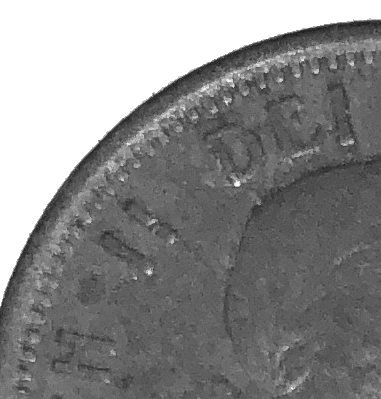

In [0]:
# scratch pad
print(gray_img.shape)
print(coins[8].shape)
img2 = coins[8]
img2 = gray_img
#coin1img_no_background_cropped = img2[img_col_left:img_col_right,img_col_top:img_col_bottom,0:3]
coin1img_no_background_cropped = img2[img_col_left:img_col_right,img_col_top:img_col_bottom]
print(coin1img_no_background_cropped.shape)

cv2_imshow(coin1img_no_background_cropped) 

#coin1img_no_background_cropped = gray_img[img_col_left:img_col_right,img_col_top:img_col_bottom]

#cv2_imshow(coin1img_no_background_cropped) 


for img_col_left in range(1,round(gray_img.shape[0]/2)):
    if gray_img.mean(axis=0)[img_col_left] < 255.0:
        break 
print(img_col_left)    
for img_col_right in range(gray_img.shape[0]-1,round(gray_img.shape[0]/2),-1):
    if gray_img.mean(axis=0)[img_col_right] < 255.0:
        break
print(img_col_right)
for img_col_top in range(1,round(gray_img.shape[1]/2)):    
    if gray_img.mean(axis=1)[img_col_top] < 255.0:
        break 
print(img_col_top)
for img_col_bottom in range(gray_img.shape[1]-1,round(gray_img.shape[1]/2),-1):
    if gray_img.mean(axis=1)[img_col_bottom] < 255.0:
      break 
print(img_col_bottom)

coin1img_no_background_cropped = gray_img[img_col_top:img_col_bottom,img_col_left:img_col_right]
cv2_imshow(coin1img_no_background_cropped) 
coin1img_no_background_cropped = coin1img_no_background[img_col_top:img_col_bottom,img_col_left:img_col_right,0:3]
cv2_imshow(coin1img_no_background_cropped) 

#coin1img_no_background_cropped = gray_img[img_col_left:img_col_top,img_col_right:img_col_bottom]

#cv2_imshow(coin1img_no_background_cropped) 